In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


In [4]:
full = cv2.imread('gdrive/My Drive/Datasets/DATA/sammy.jpg')
full = cv2.cvtColor(full,cv2.COLOR_BGR2RGB)

# Template Matching

* It is the most simplest form of object detection
* scans a larger image for a provided template by sliding the template target image across the larger image.

* we already have the part of image we are looking for.


**Note** study template matching methods

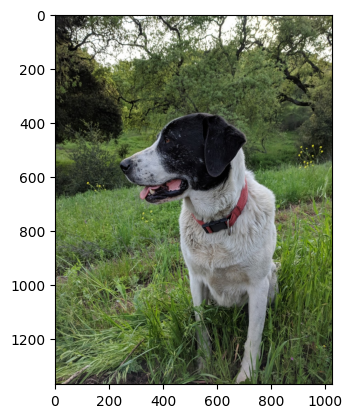

In [5]:
plt.imshow(full)

In [6]:
face = cv2.imread('gdrive/My Drive/Datasets/DATA/sammy_face.jpg')
face = cv2.cvtColor(face,cv2.COLOR_BGR2RGB)

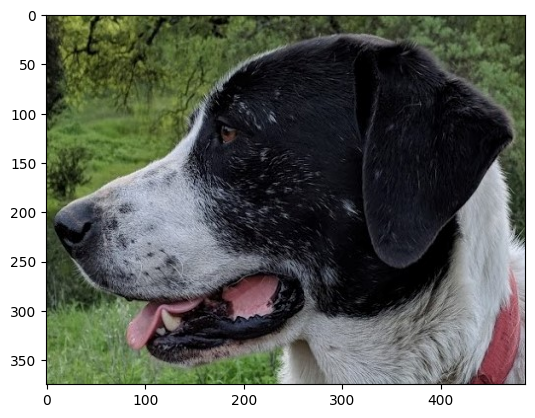

In [7]:
plt.imshow(face)  # This is exactly the same part of above full dog image.

In [8]:
methods = [
    "cv2.TM_CCOEFF",
    "cv2.TM_CCOEFF_NORMED",
    "cv2.TM_CCORR",
    "cv2.TM_CCORR_NORMED",
    "cv2.TM_SQDIFF",
    "cv2.TM_SQDIFF_NORMED"
]


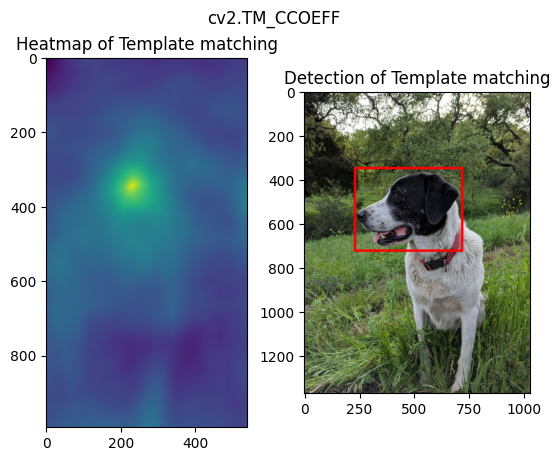

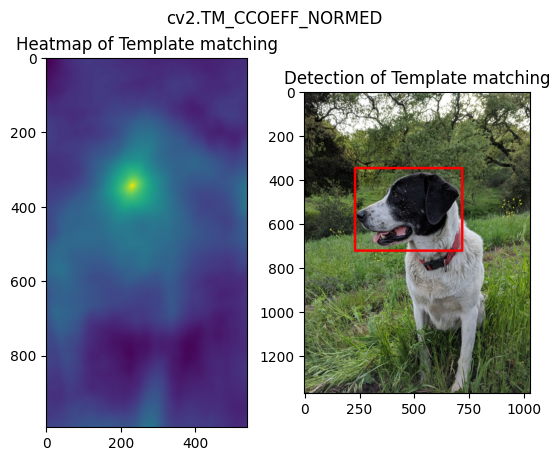

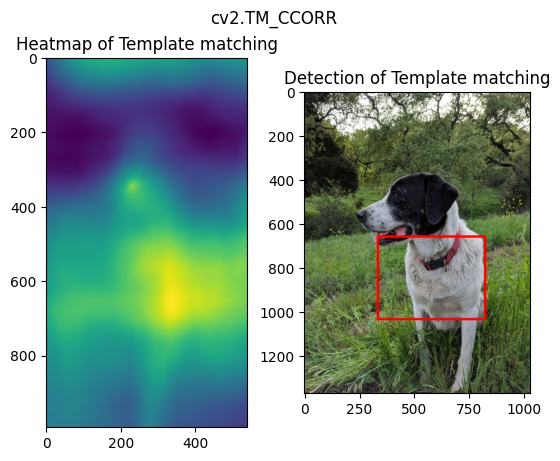

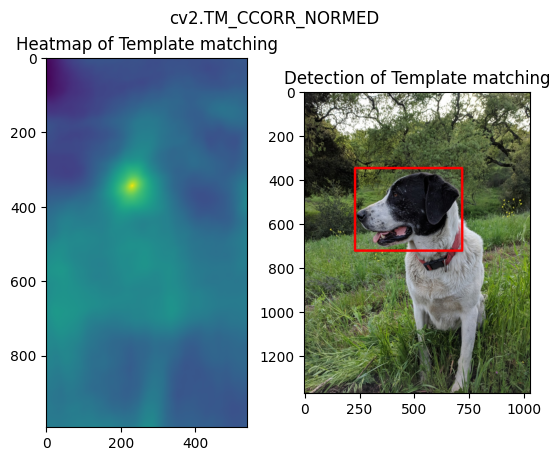

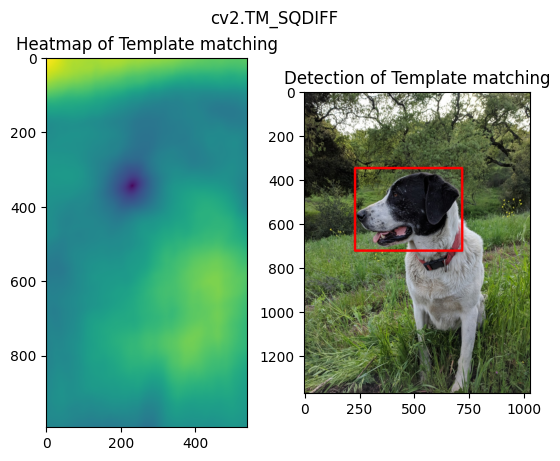

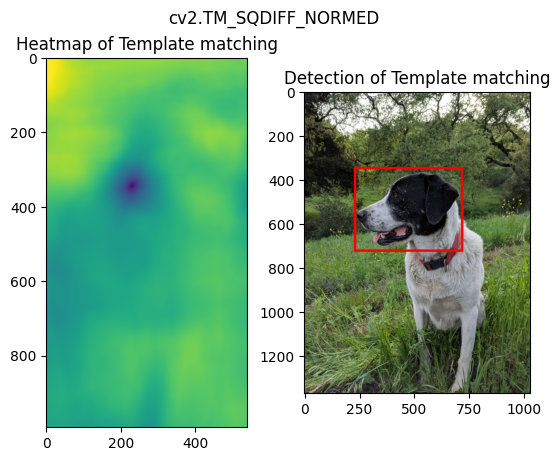

In [9]:
for i in methods:
  full_copy = full.copy()
  method = eval(i)

  # TEMPLATE MATCHING

  result = cv2.matchTemplate(full_copy,face,method) # It returns a heatmap with min and max values

  min_val,max_val,min_loc,max_loc = cv2.minMaxLoc(result)

  if method in [cv2.TM_SQDIFF ,cv2.TM_SQDIFF_NORMED]:
    top_left = min_loc
  else:
    top_left = max_loc

  height,width ,channels = face.shape
  bottom_right = ( top_left[0] + width,top_left[1] + height )
  cv2.rectangle(full_copy,top_left,bottom_right,(255,0,0),10)

  plt.subplot(121)
  plt.imshow(result)
  plt.title("Heatmap of Template matching")
  plt.subplot(122)
  plt.imshow(full_copy)
  plt.title("Detection of Template matching")
  plt.suptitle(i)
  plt.show()



In [10]:
my_method = eval('cv2.TM_CCOEFF')
res = cv2.matchTemplate(full,face,my_method)

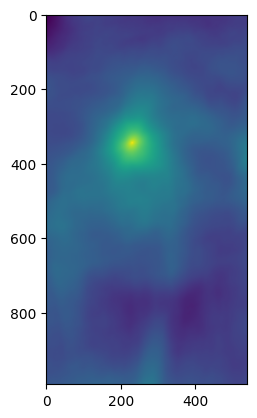

In [11]:
plt.imshow(res)

# Corner Detection:
* Harris Corner Detection
* Shi-Tomasi Corner Detection

In [12]:
flat_chess = cv2.imread('gdrive/My Drive/Datasets/DATA/flat_chessboard.png')
flat_chess= cv2.cvtColor(flat_chess,cv2.COLOR_BGR2RGB)

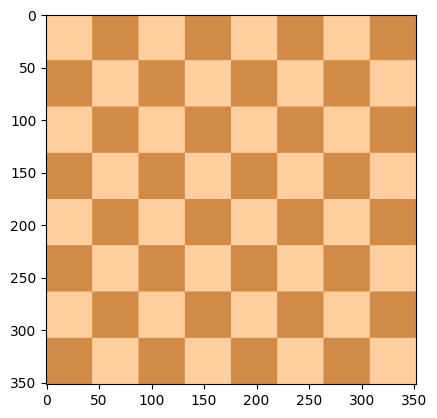

In [13]:
plt.imshow(flat_chess)

In [14]:
gray_flat = cv2.cvtColor(flat_chess,cv2.COLOR_BGR2GRAY)

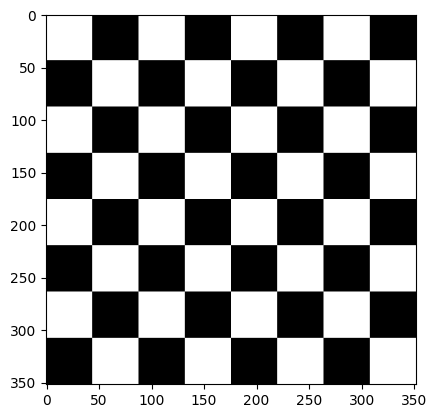

In [15]:
plt.imshow(gray_flat,'gray')

In [16]:
real_chess = cv2.imread('gdrive/My Drive/Datasets/DATA/real_chessboard.jpg')
real_chess= cv2.cvtColor(real_chess,cv2.COLOR_BGR2RGB)

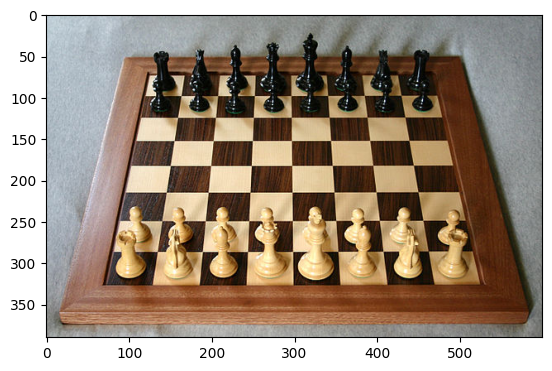

In [17]:
plt.imshow(real_chess)

In [18]:
gray_real = cv2.cvtColor(real_chess,cv2.COLOR_BGR2GRAY)

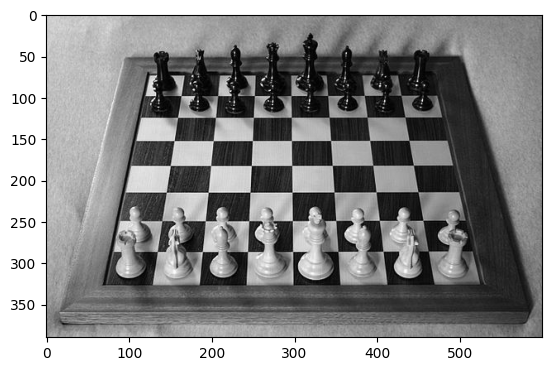

In [19]:
plt.imshow(gray_real,'gray')

In [20]:
gray = np.float32(gray_flat)

In [21]:
dst = cv2.cornerHarris(src=gray,blockSize=2,ksize=3,k=0.04)

In [22]:
dst =cv2.dilate(dst,None)

In [23]:
flat_chess[dst>0.01*dst.max()] = [255,0,0] ## It is for visualization

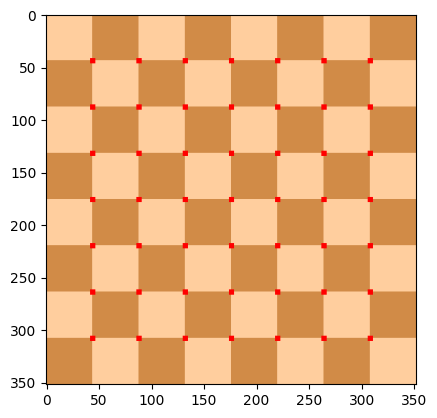

In [24]:
plt.imshow(flat_chess)

In [25]:
gray = np.float32(gray_real)

In [26]:
dst = cv2.cornerHarris(src=gray,blockSize=2,ksize=3,k=0.04)

In [27]:
dst =cv2.dilate(dst,None)

In [28]:
real_chess[dst>0.01*dst.max()] = [255,0,0] ## It is for visualization

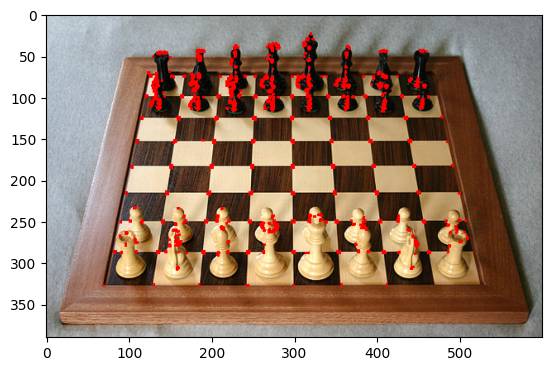

In [29]:
plt.imshow(real_chess)

In [30]:
# 5 parametr --> It would only find 5 corners we can pass -1 if we want to detect all corners
corners = cv2.goodFeaturesToTrack(gray_flat,5,0.01,10) # It is shi tomaro algorithm
corners = np.int_(corners)

In [31]:
for i in corners:
  x,y = i.ravel()
  cv2.circle(flat_chess,(x,y),4,(255,0,0),-1)


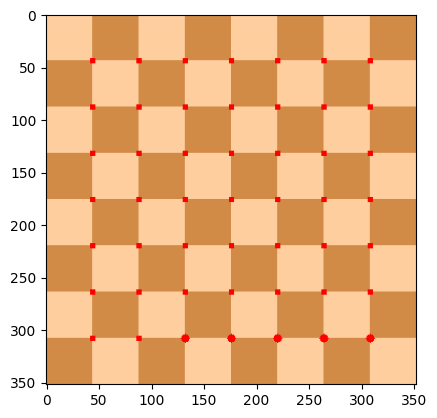

In [32]:
plt.imshow(flat_chess)

# Edge Detection
**Canny Edge Detection:**

* It applies Gaussian filter to smooth the image in order to remove the noise.
* Find intensity gradients of the image.
* Apply non -maximum supression
* Apply double threshold
* Track edge by hysteresis.

* It also requires low and high threshold.






In [33]:
img = cv2.imread('gdrive/My Drive/Datasets/DATA/sammy_face.jpg')

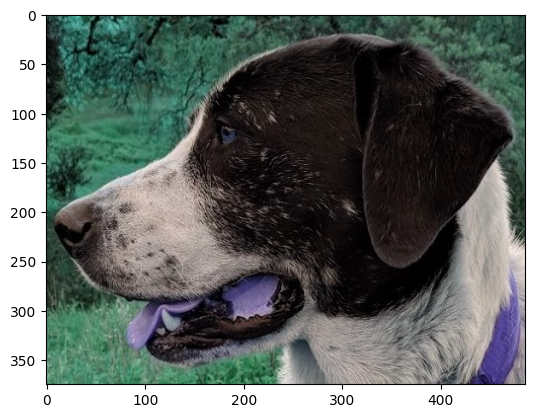

In [34]:
plt.imshow(img)

In [35]:
edges = cv2.Canny(image = img,threshold1 = 0,threshold2 =127 )

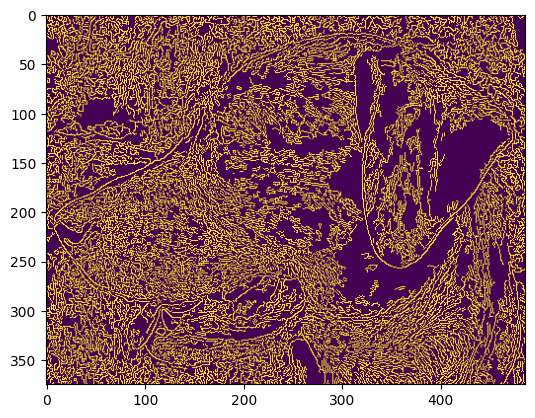

In [36]:
plt.imshow(edges)

In [37]:
med_val = np.median(img)
med_val

np.float64(64.0)

In [38]:
# Lower threshold to be either 0 or70% of the median value,which is greater.
lower = int(max(0,0.7 * med_val))
# Upper threshold To be either 130% of the medain or the max 255,which is smaller
upper = int(np.min([255,1.3 * med_val]))

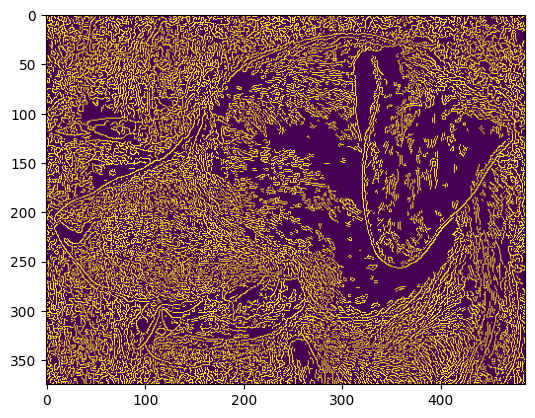

In [39]:
edges = cv2.Canny(image = img,threshold1 = lower,threshold2 =upper )
plt.imshow(edges) # It is performing worst.

In [40]:
blurred_img = cv2.blur(img,ksize = (5,5)) # It is better to blur the image before performing canny edge detection --> so that it removes noise from the image.

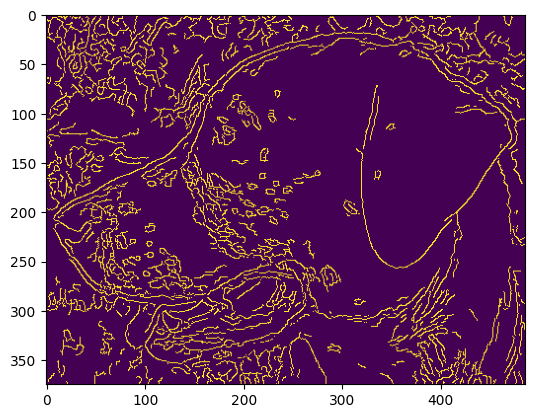

In [41]:
edges = cv2.Canny(image=blurred_img,threshold1=lower,threshold2=upper)
plt.imshow(edges)

# Grid Detection

* cameras often create a distortion in an image ,suchh as radial distortion and tangential distortion

* Grid pattterns are often use to calibrate cameras and track motion.


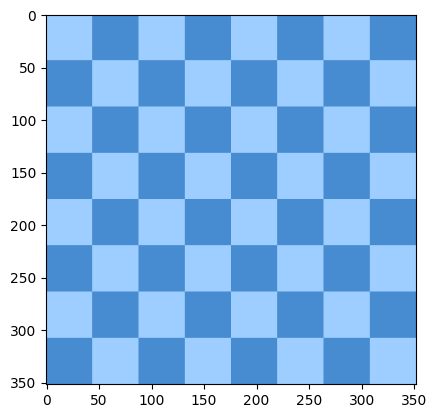

In [42]:
flat_chess = cv2.imread('gdrive/My Drive/Datasets/DATA/flat_chessboard.png')
plt.imshow(flat_chess)

In [43]:
# It is specific for the images that looks like chessboard.
found,corners = cv2.findChessboardCorners(flat_chess,(7,7))

In [44]:
found  # True means it detects corners

True

In [45]:
corners

array([[[ 43.500004,  43.500004]],

       [[ 87.5     ,  43.5     ]],

       [[131.5     ,  43.5     ]],

       [[175.5     ,  43.5     ]],

       [[219.5     ,  43.5     ]],

       [[263.5     ,  43.5     ]],

       [[307.5     ,  43.5     ]],

       [[ 43.499996,  87.50001 ]],

       [[ 87.5     ,  87.5     ]],

       [[131.5     ,  87.5     ]],

       [[175.5     ,  87.5     ]],

       [[219.5     ,  87.5     ]],

       [[263.5     ,  87.5     ]],

       [[307.5     ,  87.49999 ]],

       [[ 43.500004, 131.5     ]],

       [[ 87.5     , 131.5     ]],

       [[131.5     , 131.5     ]],

       [[175.5     , 131.5     ]],

       [[219.5     , 131.5     ]],

       [[263.5     , 131.5     ]],

       [[307.5     , 131.5     ]],

       [[ 43.499996, 175.5     ]],

       [[ 87.5     , 175.5     ]],

       [[131.5     , 175.5     ]],

       [[175.5     , 175.5     ]],

       [[219.5     , 175.5     ]],

       [[263.5     , 175.5     ]],

       [[307.5     , 175.5  

array([[[158, 206, 255],
        [158, 206, 255],
        [158, 206, 255],
        ...,
        [ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209]],

       [[158, 206, 255],
        [158, 206, 255],
        [158, 206, 255],
        ...,
        [ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209]],

       [[158, 206, 255],
        [158, 206, 255],
        [158, 206, 255],
        ...,
        [ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209]],

       ...,

       [[ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209],
        ...,
        [158, 206, 255],
        [158, 206, 255],
        [158, 206, 255]],

       [[ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209],
        ...,
        [158, 206, 255],
        [158, 206, 255],
        [158, 206, 255]],

       [[ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209],
        ...,
        [158, 206, 255],
        [158, 206, 255],
        [158, 206, 255]]], dtype=uint8)
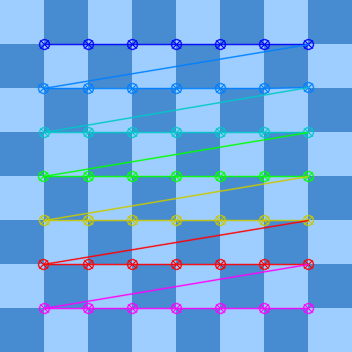

In [46]:
cv2.drawChessboardCorners(flat_chess,(7,7),corners,found)

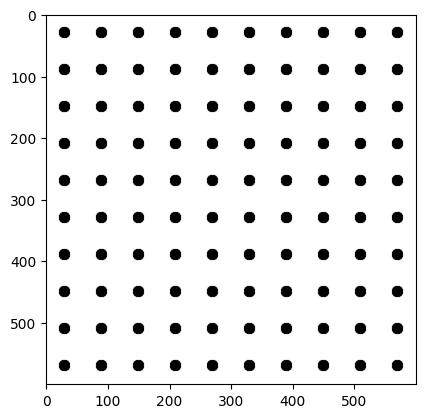

In [47]:
dots = cv2.imread('gdrive/My Drive/Datasets/DATA/dot_grid.png')
plt.imshow(dots)

In [48]:
found,corners = cv2.findCirclesGrid(dots,(10,10),cv2.CALIB_CB_SYMMETRIC_GRID)

In [49]:
found

True

In [50]:
corners

array([[[ 29.5,  29.5]],

       [[ 89.5,  29.5]],

       [[149.5,  29.5]],

       [[209.5,  29.5]],

       [[269.5,  29.5]],

       [[329.5,  29.5]],

       [[389.5,  29.5]],

       [[449.5,  29.5]],

       [[509.5,  29.5]],

       [[569.5,  29.5]],

       [[ 29.5,  89.5]],

       [[ 89.5,  89.5]],

       [[149.5,  89.5]],

       [[209.5,  89.5]],

       [[269.5,  89.5]],

       [[329.5,  89.5]],

       [[389.5,  89.5]],

       [[449.5,  89.5]],

       [[509.5,  89.5]],

       [[569.5,  89.5]],

       [[ 29.5, 149.5]],

       [[ 89.5, 149.5]],

       [[149.5, 149.5]],

       [[209.5, 149.5]],

       [[269.5, 149.5]],

       [[329.5, 149.5]],

       [[389.5, 149.5]],

       [[449.5, 149.5]],

       [[509.5, 149.5]],

       [[569.5, 149.5]],

       [[ 29.5, 209.5]],

       [[ 89.5, 209.5]],

       [[149.5, 209.5]],

       [[209.5, 209.5]],

       [[269.5, 209.5]],

       [[329.5, 209.5]],

       [[389.5, 209.5]],

       [[449.5, 209.5]],

       [[509

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)
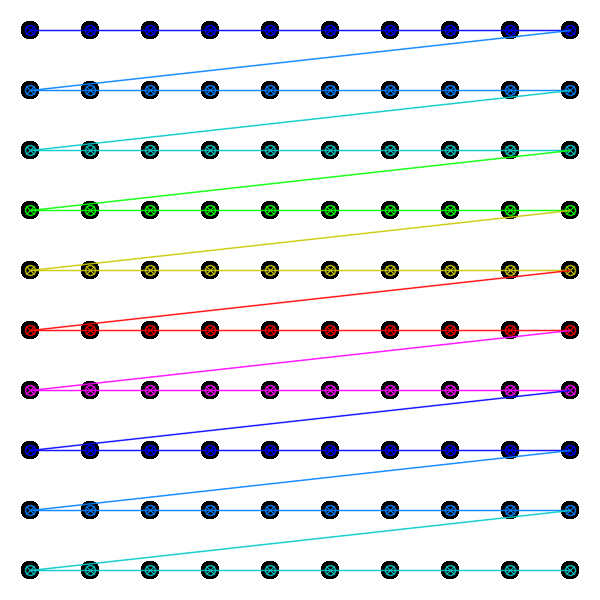

In [51]:
cv2.drawChessboardCorners(dots,(10,10),corners,found)

# Contour Detection

* They are defined as simply a curve joining all the continuous points(along the boundry) having same color, or intensity.

* Contours are useful tool for shape analysis and obect detection and recognition.


In [52]:
img = cv2.imread('gdrive/My Drive/Datasets/DATA/internal_external.png',0)

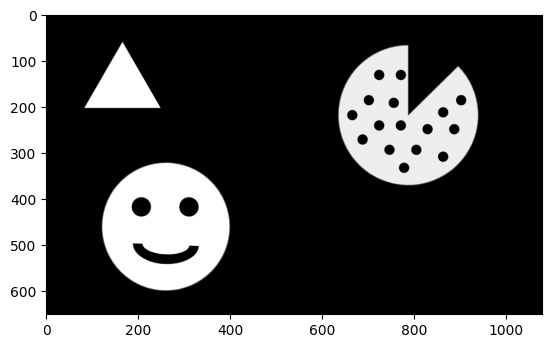

In [53]:
plt.imshow(img,'gray')

In [54]:
contours , hierachy = cv2.findContours(img,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)

In [55]:
type(contours)


tuple

In [56]:
len(contours)

22

In [57]:
external_contours = np.zeros(img.shape)

In [58]:
for i in range(len(contours)):
  if hierachy[0][i][3] == -1: # It is indexing last column of each row it is essentially means it is external contour.
    cv2.drawContours(external_contours,contours,i,255,-1)

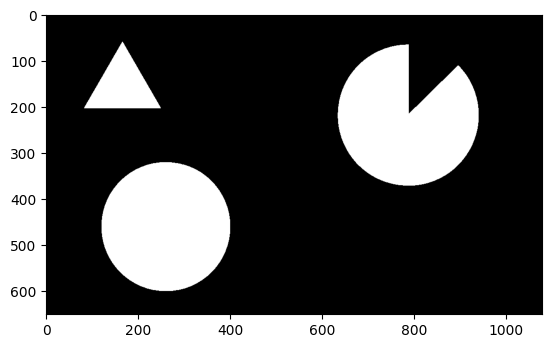

In [59]:
plt.imshow(external_contours,'gray')

In [60]:
internal_contours = np.zeros(img.shape)
for i in range(len(contours)):
  if hierachy[0][i][3] != -1:
    cv2.drawContours(internal_contours,contours,i,255,-1)

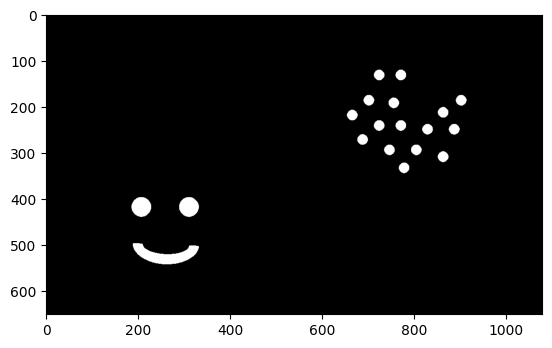

In [61]:
plt.imshow(internal_contours,'gray')

# Feature Matching
* It extracts key features from an input image(using ideas like corner,edge and contour detection).
*Then by using a distance calculation,finds all the matches in a secondary image.
* This means we are no longer required to have an exact copy of target image.

**Methods**
*

In [62]:
def display(img,cmap='gray'):
  fig = plt.figure(figsize=(12,10))
  ax = fig.add_subplot(111)
  ax.imshow(img,cmap)

In [63]:
reeses = cv2.imread('gdrive/My Drive/Datasets/DATA/reeses_puffs.png',0)

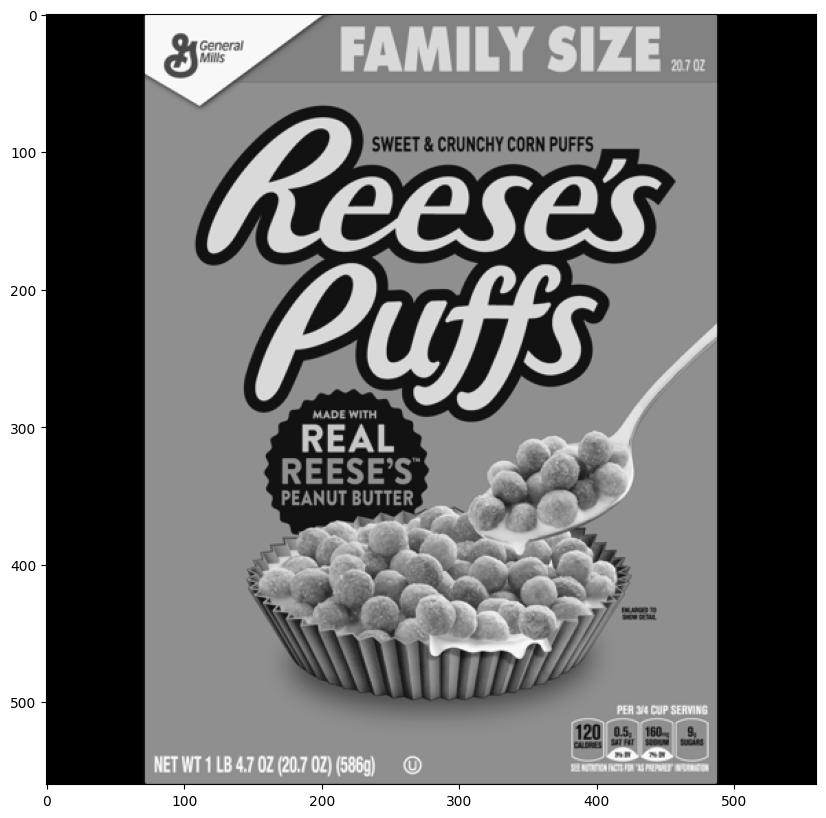

In [64]:
display(reeses)

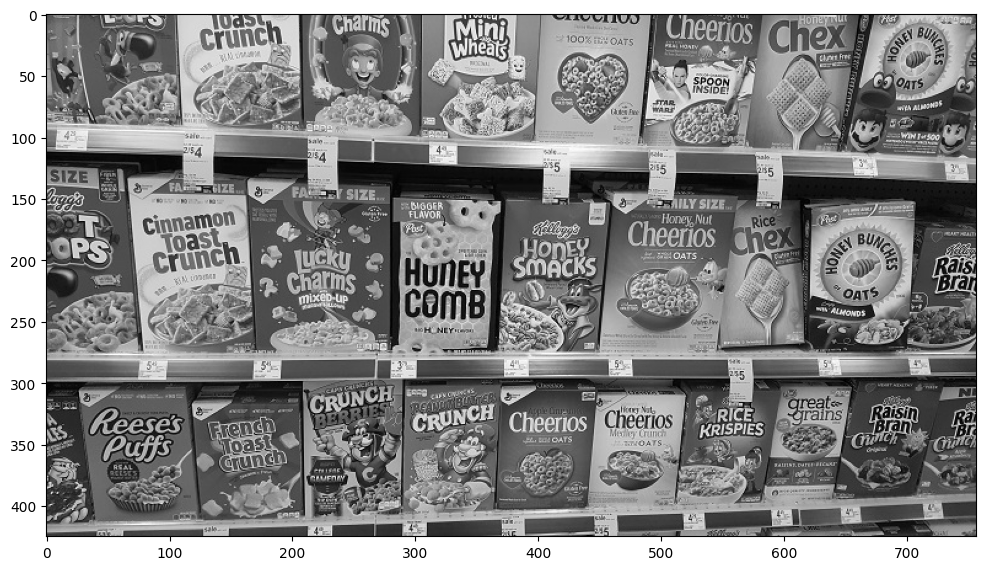

In [65]:
cereals = cv2.imread('gdrive/My Drive/Datasets/DATA/many_cereals.jpg',0)
display(cereals)

In [66]:
# Brute Force Detection

orb = cv2.ORB_create()

In [67]:
kp1,des1 = orb.detectAndCompute(reeses,None)
kp2,des2 = orb.detectAndCompute(cereals,None)

In [68]:
# Now create matching object
bf = cv2.BFMatcher(cv2.NORM_HAMMING,crossCheck=True)

In [69]:
matches = bf.match(des1,des2)

In [70]:
matches = sorted(matches,key=lambda x:x.distance)

In [71]:
reeses_matches = cv2.drawMatches(reeses,kp1,cereals,kp2,matches[0:25],None,flags = 2) # Just because all matches are too much.

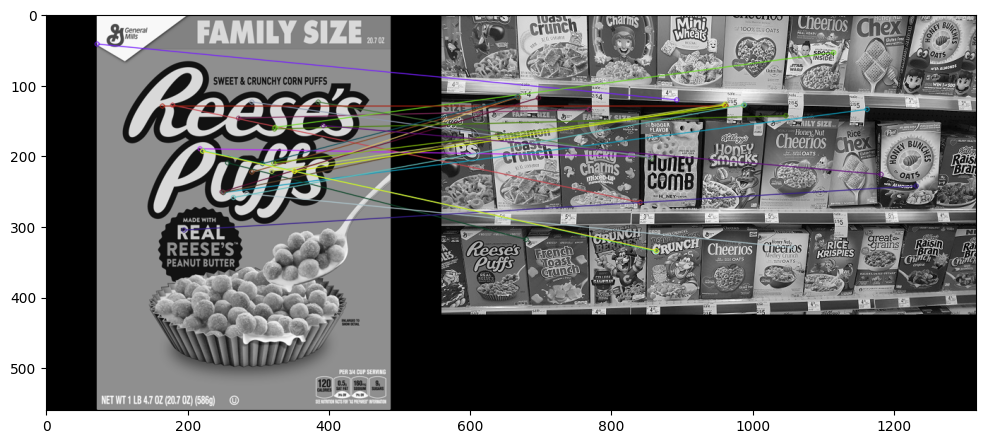

In [72]:
display(reeses_matches) # it is not matching properly.

In [73]:
# SIFT Descriptors
sift = cv2.xfeatures2d.SIFT_create()

In [74]:
kp1,des1 = sift.detectAndCompute(reeses,None)
kp2,des2 = sift.detectAndCompute(cereals,None)

In [75]:

bf = cv2.BFMatcher()

In [76]:
matches = bf.knnMatch(des1,des2,k=2) # k= 2 2 best macthes

In [77]:
good = [] # to hold good matches

 # LESS DISTANCE ---> GOOD MATCH.
for match1,match in matches:
  # IF MATCH 1 DISTANCE IS LESS THAN 75% OF MATCH 2 DISTANCE
  # THEN DECRIPTOR WAS  A GOOD MATCH
  if match1.distance < 0.75 * match.distance:
    good.append([match1])

In [78]:
len(good)

79

In [79]:
sift_matches = cv2.drawMatchesKnn(reeses,kp1,cereals,kp2,good,None,flags=2)

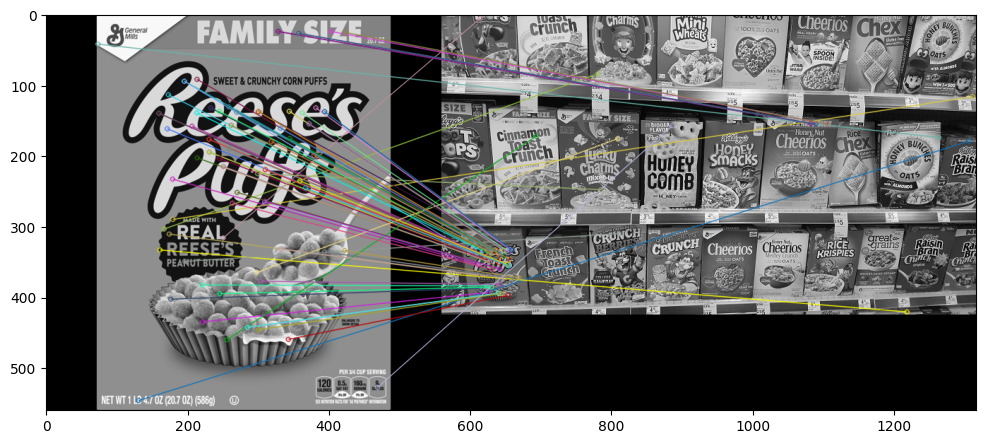

In [80]:
display(sift_matches)

In [81]:
# FLAN BASED MATCHER.
sift = cv2.xfeatures2d.SIFT_create()

In [82]:
kp1,des1 = sift.detectAndCompute(reeses,None)
kp2,des2 = sift.detectAndCompute(cereals,None)

In [83]:
# FLAN
# It is not gonna find best matches
# It is near matches

FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE,trees=5)
search_params = dict(checks=50)


In [84]:
flann = cv2.FlannBasedMatcher(index_params,search_params)


In [85]:
matches = flann.knnMatch(des1,des2 , k =2)

In [86]:
good = [] # to hold good matches


for match1,match in matches:
  if match1.distance < 0.75 * match.distance:
    good.append([match1])

In [87]:
flann_matches = cv2.drawMatchesKnn(reeses,kp1,cereals,kp2,good,None,flags=2)


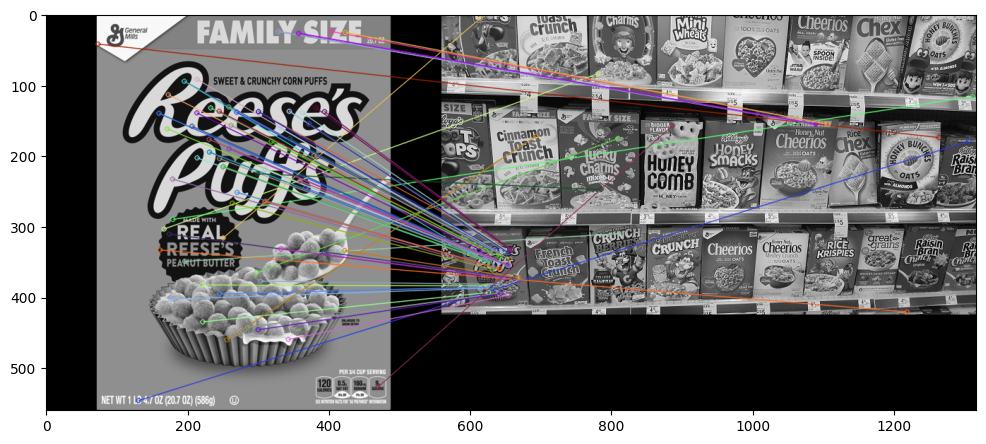

In [88]:
display(flann_matches)

# Watershed Algorithm


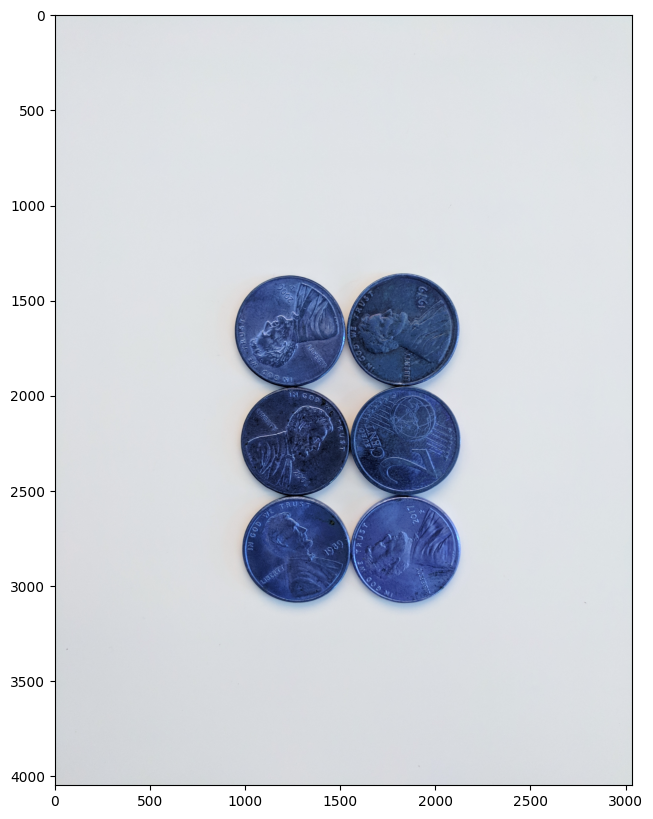

In [89]:
sep_coins = cv2.imread('gdrive/My Drive/Datasets/DATA/pennies.jpg')
display(sep_coins)

In [89]:
## Median Blur ---> to focus on the senter of image.
# Gray Scale
# Binary Threshold
# Find Contours

In [90]:
sep_blur = cv2.medianBlur(sep_coins,25)

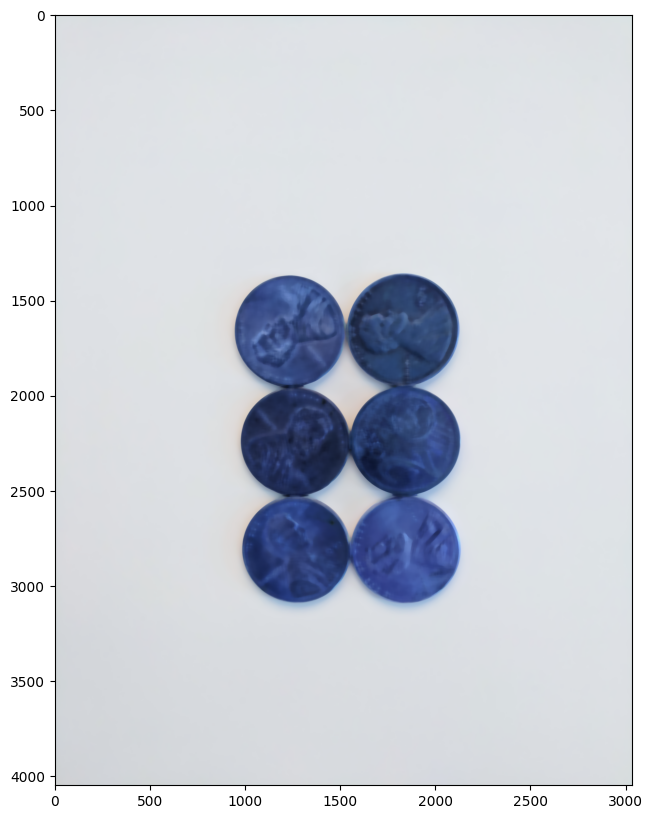

In [91]:
display(sep_blur)

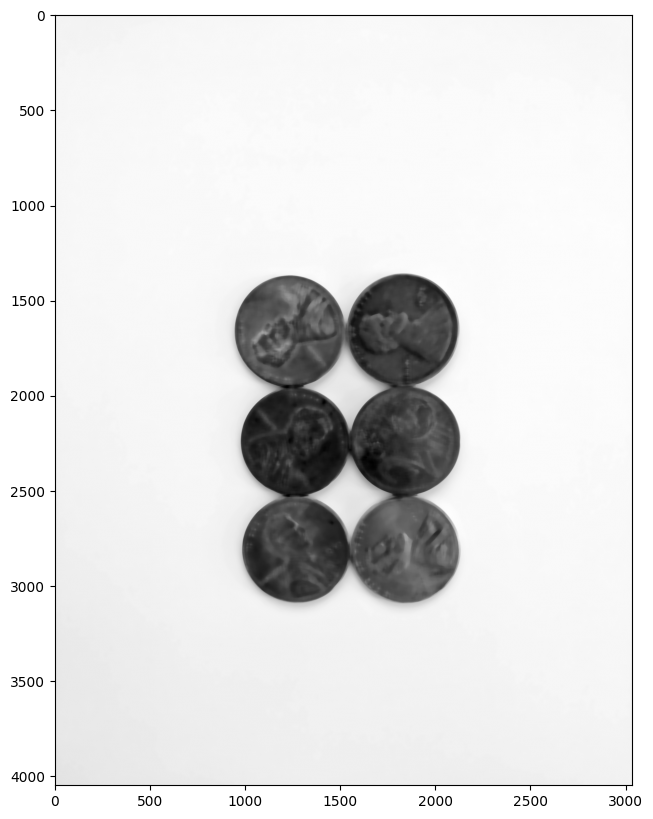

In [92]:
gray_sep_coins = cv2.cvtColor(sep_blur,cv2.COLOR_BGR2GRAY)
display(gray_sep_coins)

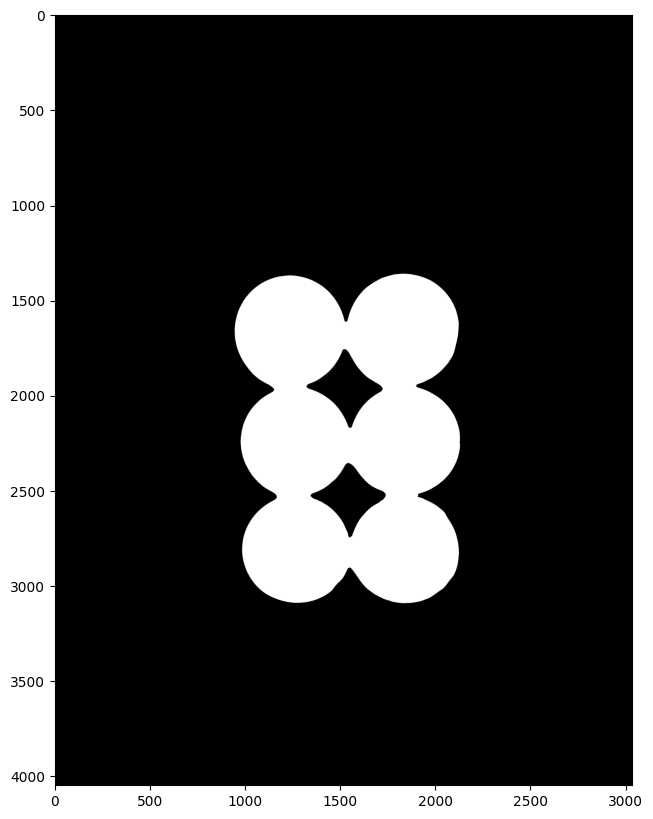

In [96]:
ret, sep_thresh = cv2.threshold(gray_sep_coins,160,255,cv2.THRESH_BINARY_INV)
display(sep_thresh)

In [101]:
contours,hierachy = cv2.findContours(sep_thresh.copy(),cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)

In [104]:
for i in range(len(contours)):
  if(hierachy[0][i][3] == -1):
    cv2.drawContours(sep_coins,contours,i,(255,0,0),10)

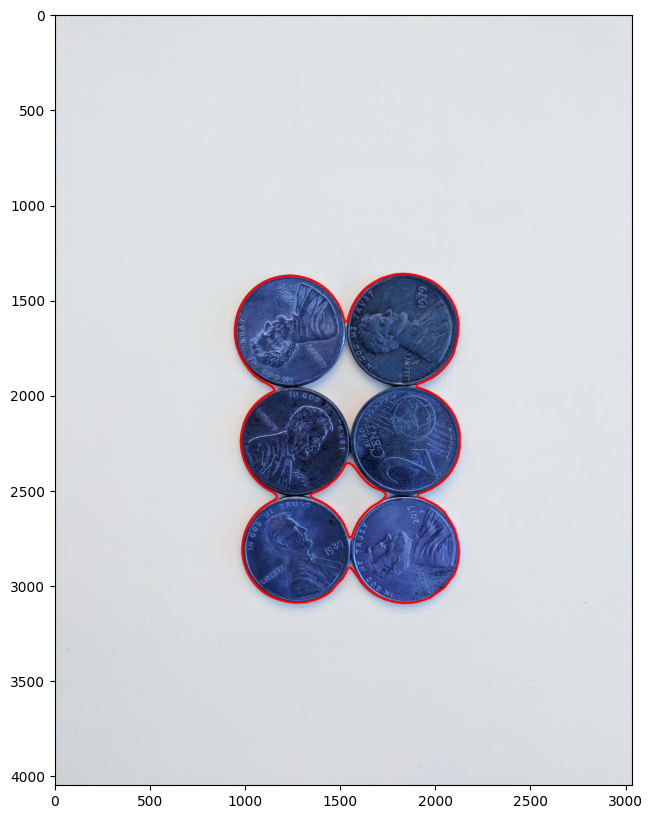

In [105]:
display(sep_coins)  ## This is without using watershed algorithm.

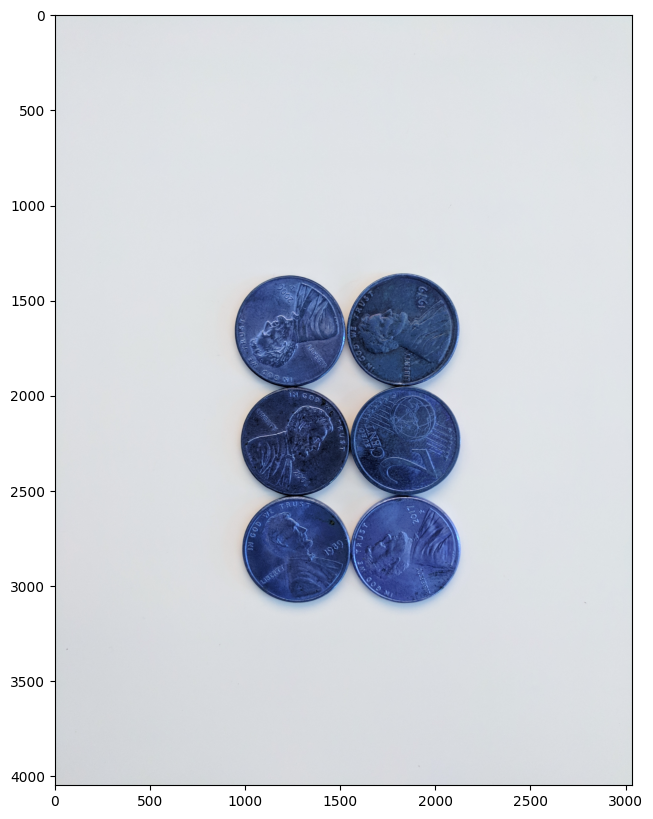

In [106]:
img = cv2.imread('gdrive/My Drive/Datasets/DATA/pennies.jpg')
display(img)

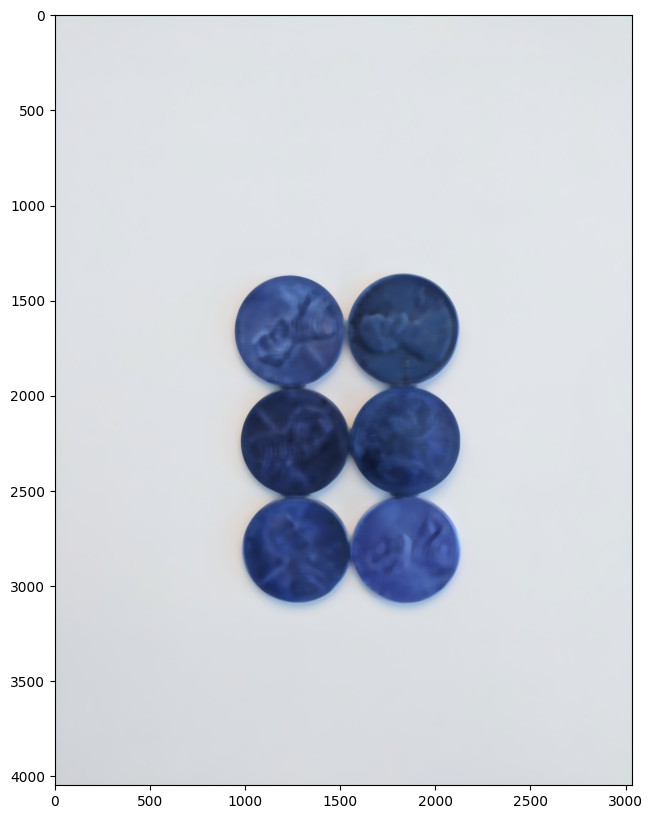

In [107]:
img = cv2.medianBlur(img,35)
display(img)

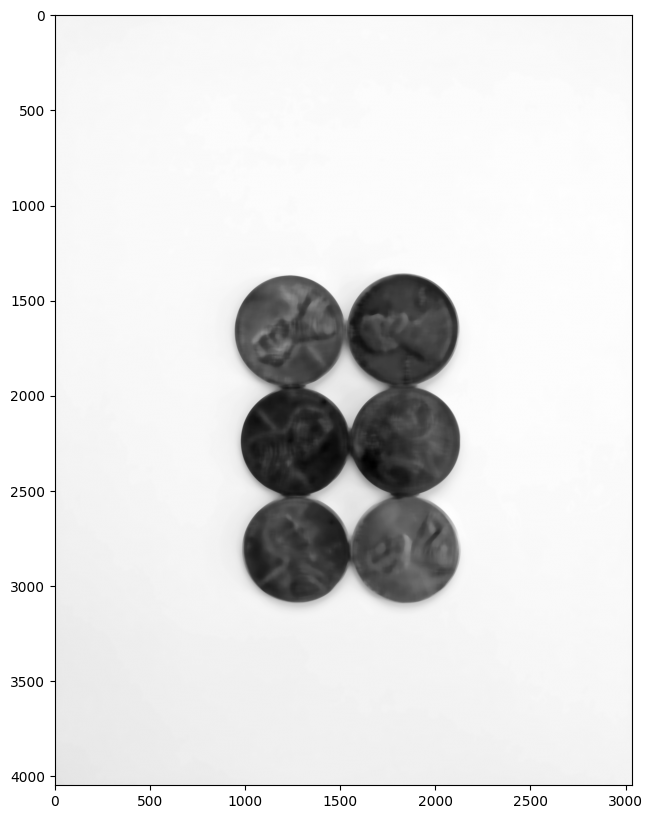

In [108]:
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
display(gray)

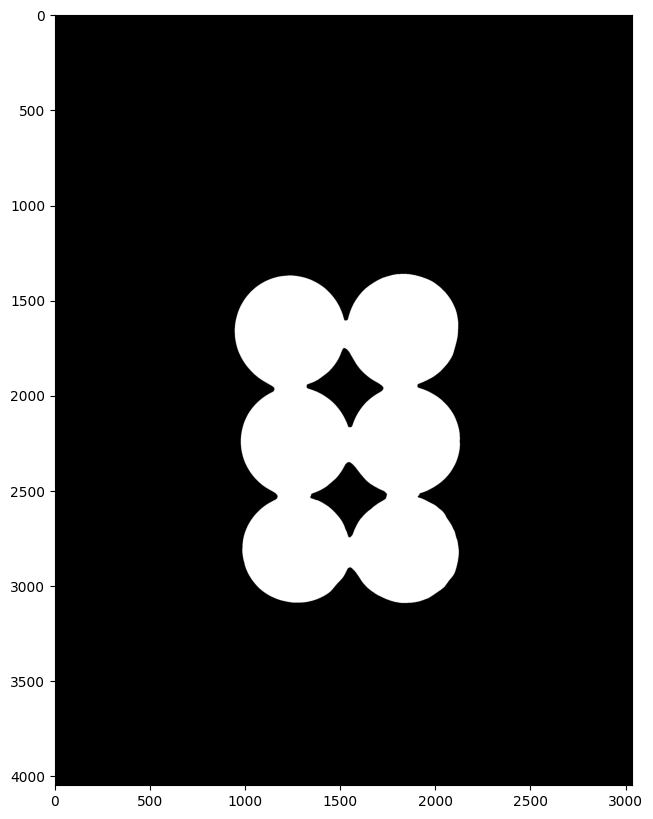

In [112]:
ret,thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU) ## OTSU Threshold
display(thresh)

In [115]:
# Noise Removal

kernal = np.ones((3,3),np.uint8)
kernal

array([[1, 1, 1],
       [1, 1, 1],
       [1, 1, 1]], dtype=uint8)

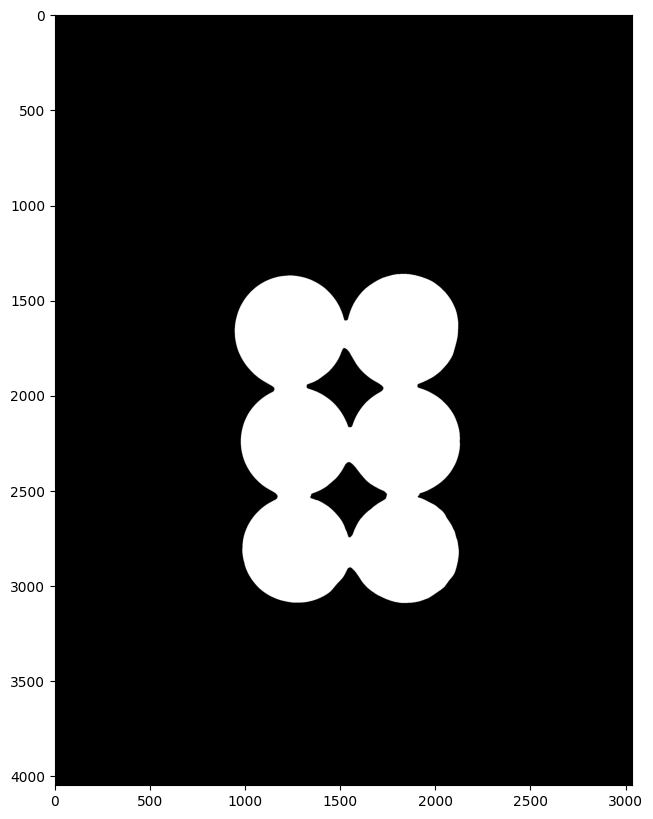

In [116]:
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernal,iterations = 2)
display(opening)

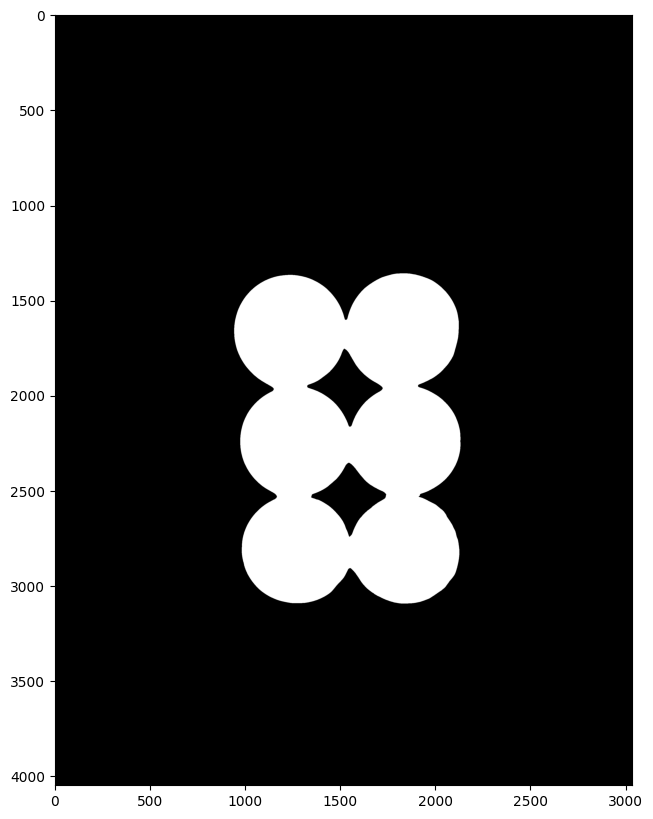

In [123]:
sure_bg = cv2.dilate(opening,kernal,iterations = 3)
display(sure_bg)

In [118]:
## Distance transform.

dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)

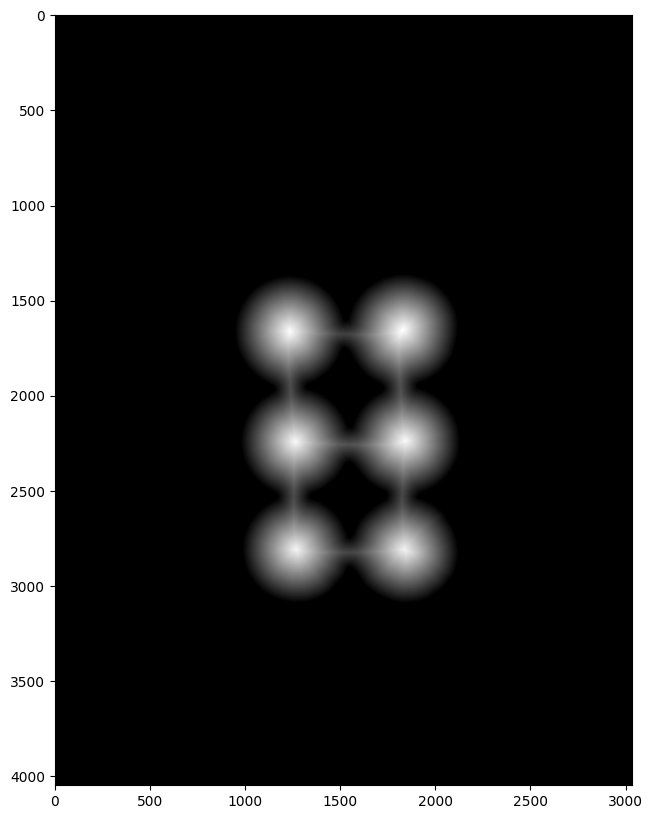

In [119]:
display(dist_transform)

In [120]:
ret,sure_fg = cv2.threshold(dist_transform,0.7 * dist_transform.max(),255,0)

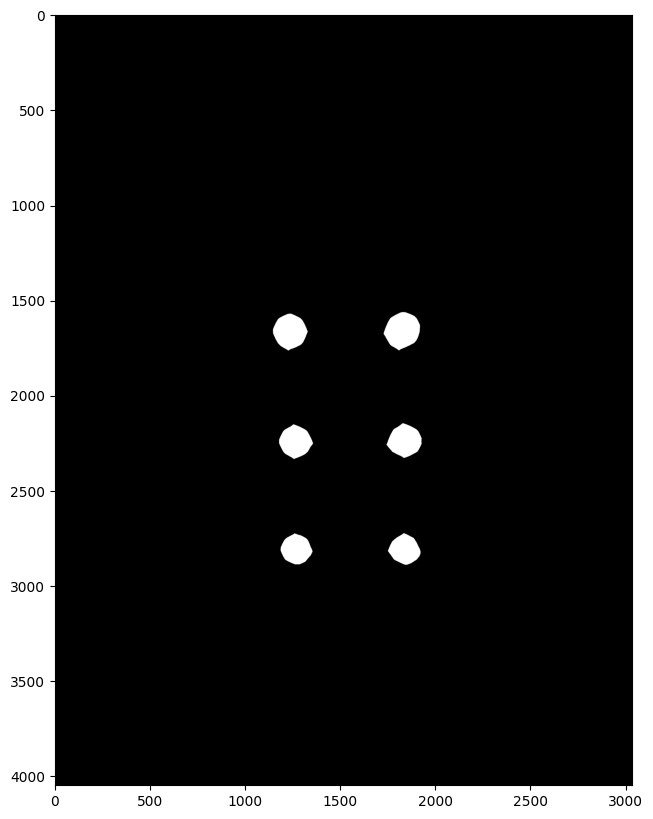

In [121]:
display(sure_fg)

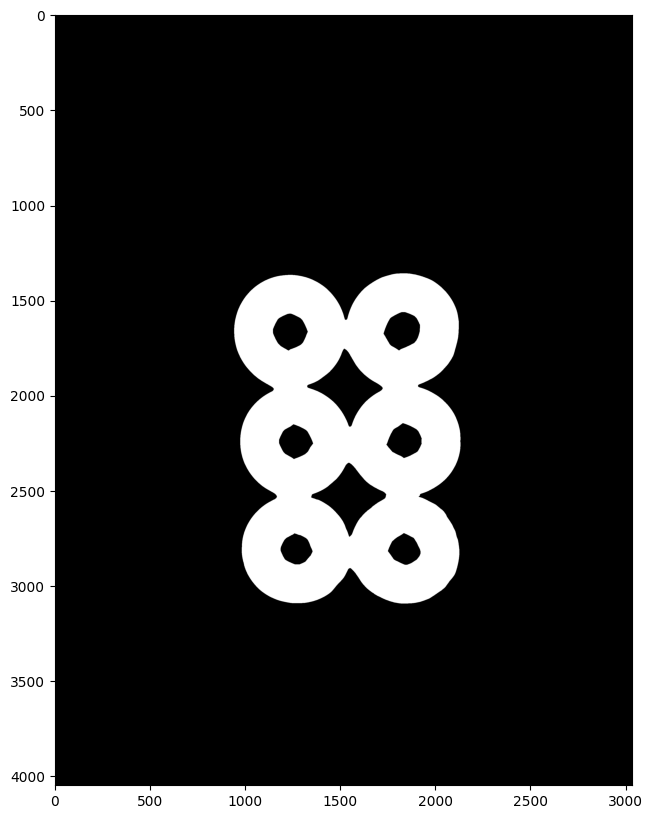

In [124]:
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)
display(unknown)

In [125]:
##
ret , markers = cv2.connectedComponents(sure_fg)

In [126]:
markers

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

In [127]:
markers = markers + 1

In [128]:
markers[unknown == 255] = 0

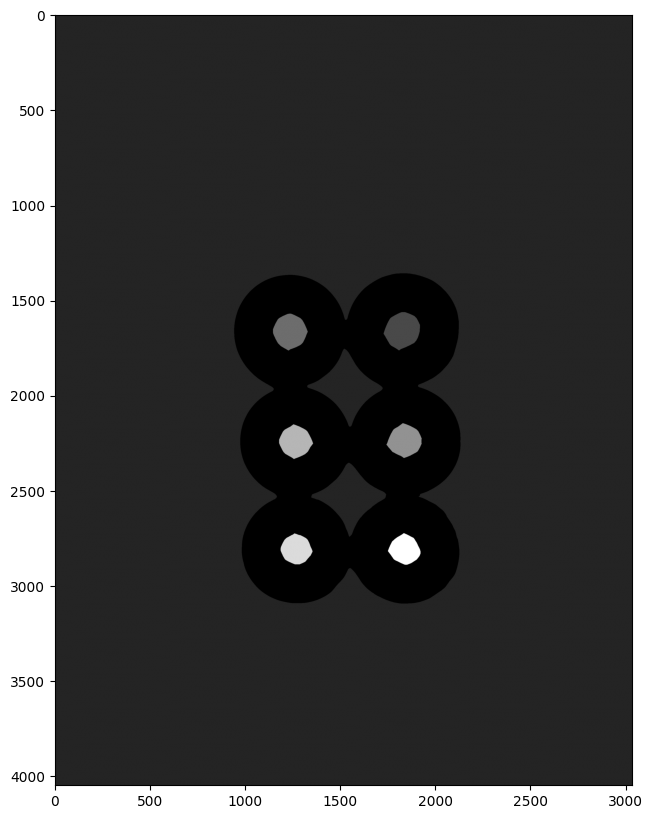

In [129]:
display(markers)

In [130]:
markers = cv2.watershed(img,markers)

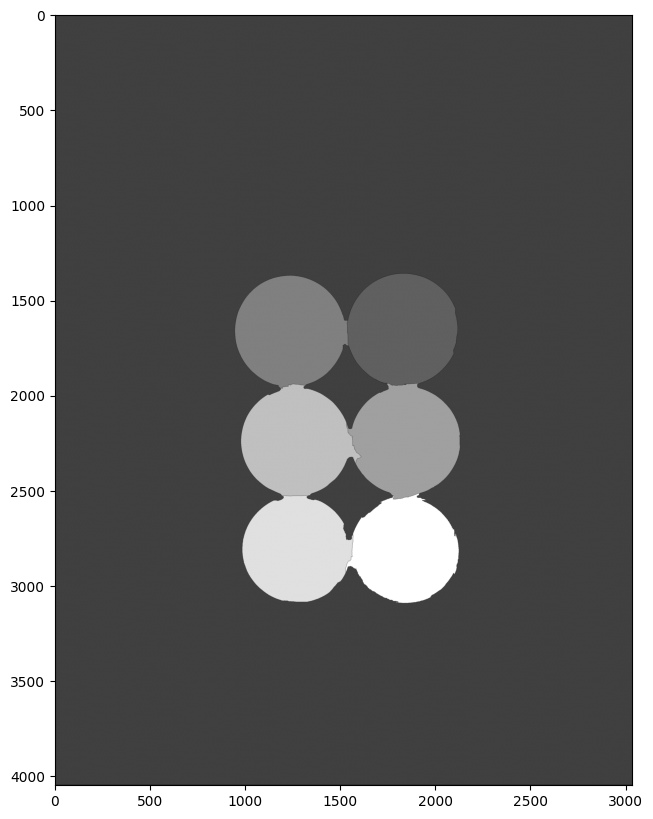

In [131]:
display(markers)

In [132]:
contours,hierachy = cv2.findContours(markers.copy(),cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)

In [133]:
for i in range(len(contours)):
  if(hierachy[0][i][3] == -1):
    cv2.drawContours(sep_coins,contours,i,(255,0,0),10)

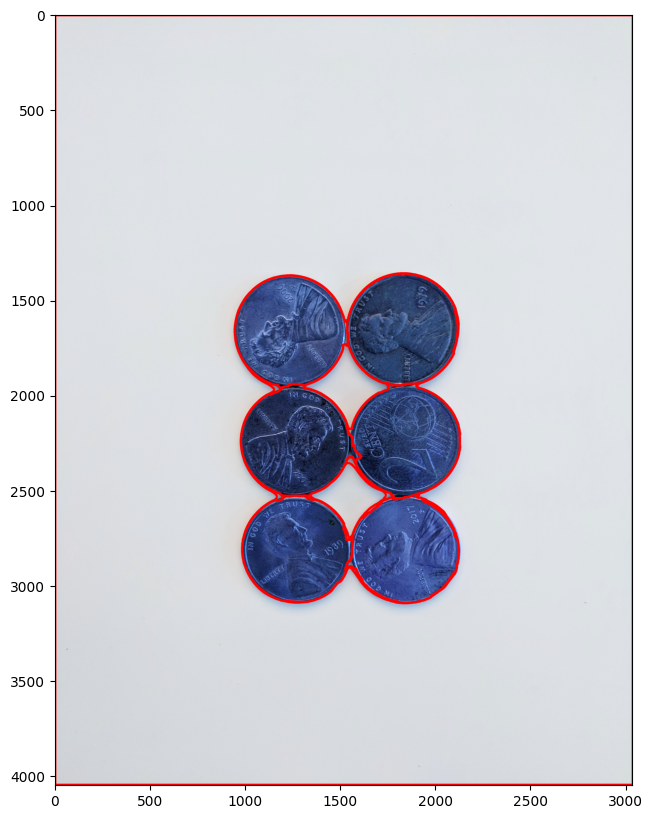

In [134]:
display(sep_coins)

# Face Detection